**3.1 Install required libraries and frameworks**

In [ ]:
# Install required libraries and frameworks
#!pip install yellowbrick  
#!pip install -U sentence-transformers

In [3]:
import matplotlib.pyplot as plt 
import pandas as pd
import numpy as np 
from tqdm import tqdm
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from sentence_transformers import SentenceTransformer, util
from sklearn import metrics
import seaborn as sns 
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import string

sns.set(rc={'figure.figsize':(12,6)})
pd.set_option('display.max_colwidth', None)

In [4]:
df = pd.read_csv('/content/drive/MyDrive/se_data/clean_data.csv')
df.dropna(inplace=True)
df.head(2)

,title,basic_qualif,pref_qualif
0,google cloud program manager,"ba bs degree or equivalent practical experience. 3 years of experience in program and or project management in cloud computing, enterprise software and or marketing technologies.","experience in the business technology market as a program manager in saas, cloud computing, and or emerging technologies. significant cross-functional experience across engineering, sales, and marketing teams in cloud computing or related technical fields. proven successful program outcomes from idea to launch in multiple contexts throughout your career. ability to manage the expectations, demands and priorities of multiple internal stakeholders based on overarching vision and success for global team health. ability to work under pressure and possess flexibility with changing needs and direction in a rapidly-growing organization. strong organization and communication skills."
1,"supplier development engineer (sde), cable connector","bs degree in an engineering discipline or equivalent practical experience. 7 years of experience in cable connector design or manufacturing in an npi role. experience working with interconnect engineering and product design (pd) mechanical engineer in developing, manufacturing and testing. ability to speak and write in english and mandarin fluently and idiomatically.","bsee, bsme or bsie degree. experience of using statistics tools for data analysis, distribution histogram pareto chart, process control chart, design of experiment (doe), correlation analysis, etc. demonstrated knowledge in pcba manufacturing process and quality control. familar with cable connector related components' manufacturing: moldling, stamping, die-casting, lim, mim process and materials. self starter with innovation, integrity and attention to detail. ability to travel up to 50% of the time"


In [5]:
df['qualifications'] = df.basic_qualif + df.pref_qualif

**3.2 Use Sentence Transformer for vecotorizing the data**

In [6]:
# refrence : https://www.sbert.net/docs/pretrained_models.html
#Load the model
model = SentenceTransformer('sentence-transformers/multi-qa-MiniLM-L6-cos-v1')

#Encode query and documents
#embeddings = model.encode(df.qualifications.values)
#np.save('/content/drive/MyDrive/se_data/embeddings.npy', embeddings)
#embeddings = np.load('/content/drive/MyDrive/se_data/embeddings.npy')

* Why use sentence embeddings ? 
  
  Sentence embeddings are trained on plethora of internet data and cover different aspects like semantic meaning and syntactic similarity and therefore are suitable for our usecase where we are trying to group job postings with similar qualifications. 

* Why Choose 'multi-qa-MiniLM-L6-cos-v1' for vectorization ? 

  As seen in the exploratory data analysis, majority of the 'qualifications' are of length 200 words and 'preffered qualifications' are of length 300 words. So, we need a sentence embedding which is can take an input of size of around 512 words. Besides, as we are using KMeans for clustering the input dimension needs to be as small as possible. Increase in the dimension of input vectors will lead poor performance owing to curse of dimensionality. 'multi-qa-MiniLM-L6-cos-v1' is a model that takes in input of size of 512 words and produces vectors of dimension 384 (smallest in the family of sentence embeddings), we have therefore chosen it over other variants of sentence embeddings.

**3.3 Determne the number of ideal clusters**

100%|██████████| 23/23 [01:36<00:00,  4.21s/it]


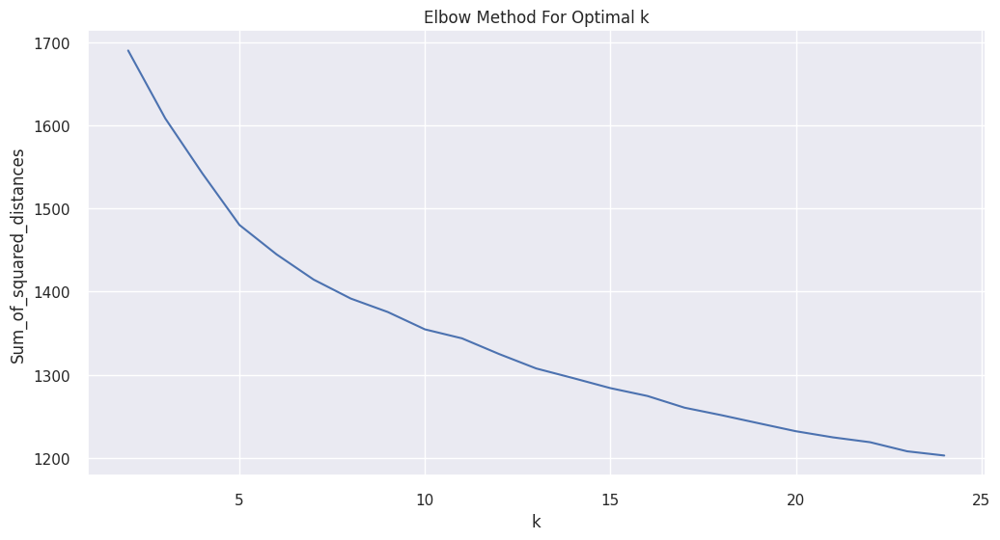

In [8]:
# reference : https://towardsdatascience.com/how-to-easily-cluster-textual-data-in-python-ab27040b07d8
Sum_of_squared_distances = []
K = range(2,25)
for k in tqdm(K):
    km = KMeans(n_clusters=k, max_iter=200, n_init=10,  init='k-means++')
    km = km.fit(embeddings)
    Sum_of_squared_distances.append(km.inertia_)
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In the above diagram, we have used euclidean distance as distance measure to find the ideal number of clusters using elbow method. However as we can see, there is no clearly defined 'knee point' which would enable us to determine the number of clusters from the graph above. We will therefore have to resort to some advance method to determine the number of clusters.

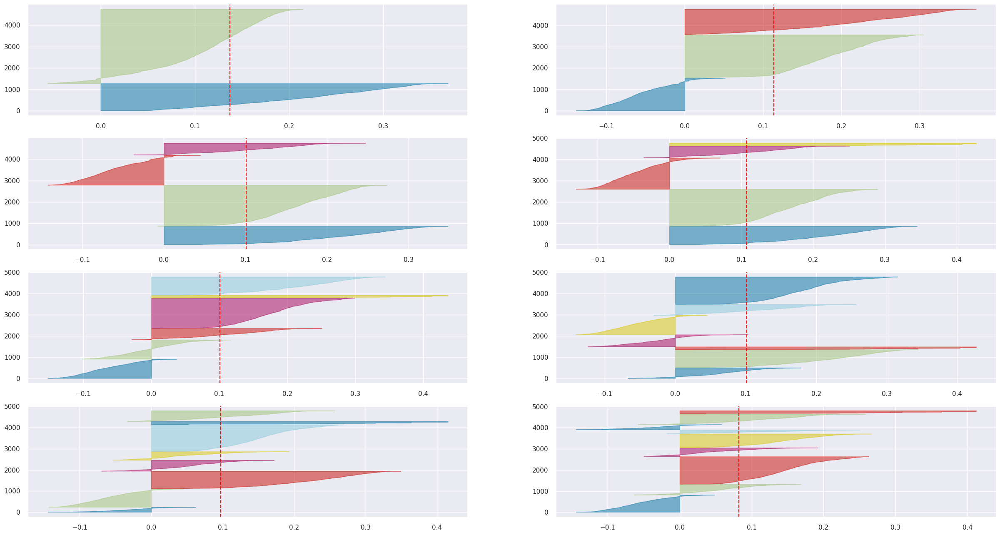

In [9]:
# reference : https://towardsdatascience.com/elbow-method-is-not-sufficient-to-find-best-k-in-k-means-clustering-fc820da0631d
fig, ax = plt.subplots(4, 2, figsize=(30,16))
for i in range(2, 10):
    '''
    Create KMeans instances for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=200, random_state=42)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(embeddings) 

In the graph above, we have tried several number of clusters using silhoutte clustering. The graphs above can be interpreted as follows : 
1. Each colored horizontal peak like structure indicates a separate cluster. Note that the same color can represent mulitple clusters but they are separated from each other and are clearly distinguishable.
2. If the horizontal peaks of the different colored segments lie on the right side of the red dotted line, it indicates that the cluster formed is well separated from the rest of the data. 

From the above graphs we can see that, the peaks of those structures are well beyond the red-dotten line for the graphs indicating 6 or 8 clusters.  

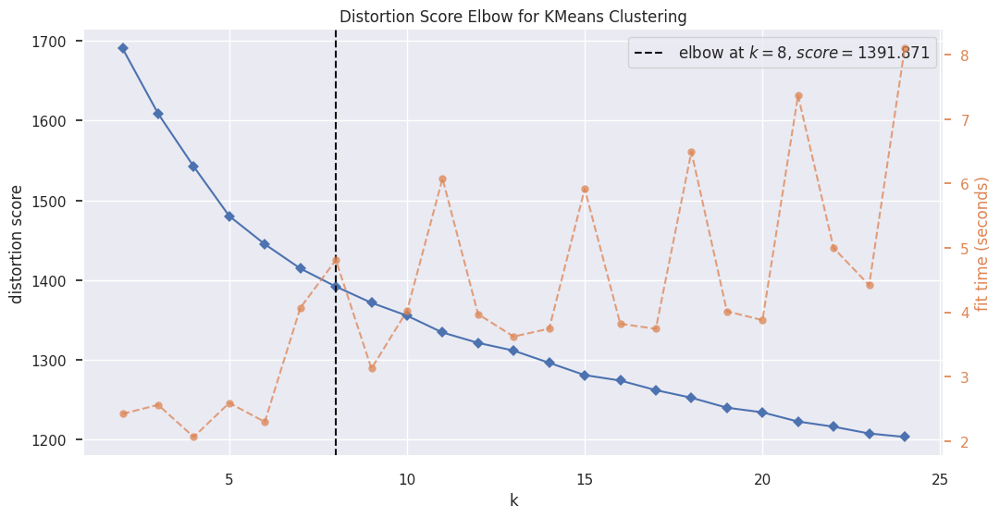

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [10]:
# Instantiate the clustering model and visualizer
km = KMeans(n_clusters=k, max_iter=200, n_init=10,  init='k-means++')
visualizer = KElbowVisualizer(km, k=(2,25))
 
visualizer.fit(embeddings)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

From the above graph, we can say that suggested number of clusters is 8. But, '6' too is performing quite well. So, let us just implement clustering for both 6 clusters and 8 clusters and compute the silhoutte coefficint for both, the one giving higher value will be selected as the ideal number of clusters.

In [12]:
for num_cluster in [6,7,8] : 
  # Import KMeans Model
  # Create Kmeans object and fit it to the training data 
  kmeans = KMeans(n_clusters=num_cluster, init='k-means++', n_init=10, max_iter=200, random_state=42).fit(embeddings)

  # Get the labels using KMeans
  pred_labels = kmeans.labels_

  # Compute DBI score
  dbi = metrics.davies_bouldin_score(embeddings, pred_labels)

  # Compute Silhoutte Score
  ss = metrics.silhouette_score(embeddings, pred_labels , metric='euclidean')

  # Print the DBI and Silhoutte Scores
  print(f'Number of clusters {num_cluster}')
  print("DBI Score: ", dbi, "\nSilhoutte Score: ", ss)
  print('\n')

Number of clusters 6
DBI Score:  3.072767985644133 
Silhoutte Score:  0.10066369


Number of clusters 7
DBI Score:  2.9988700493631297 
Silhoutte Score:  0.10139586


Number of clusters 8
DBI Score:  2.992614338265934 
Silhoutte Score:  0.097331025




As evident from the above graph, Silhoutte score for 6 clusters is higher than that of 8, so we will choose number of clusters as 6

**3.4 Train the K-Means on qualifications data to cluster jobs with similar qualifications**

In [13]:
kmeans = KMeans(n_clusters=6, init='k-means++', n_init=10, max_iter=200, random_state=42).fit(embeddings)
pred_labels = kmeans.labels_
df['label'] = pred_labels
df.head(2)

,title,basic_qualif,pref_qualif,qualifications,label
0,google cloud program manager,"ba bs degree or equivalent practical experience. 3 years of experience in program and or project management in cloud computing, enterprise software and or marketing technologies.","experience in the business technology market as a program manager in saas, cloud computing, and or emerging technologies. significant cross-functional experience across engineering, sales, and marketing teams in cloud computing or related technical fields. proven successful program outcomes from idea to launch in multiple contexts throughout your career. ability to manage the expectations, demands and priorities of multiple internal stakeholders based on overarching vision and success for global team health. ability to work under pressure and possess flexibility with changing needs and direction in a rapidly-growing organization. strong organization and communication skills.","ba bs degree or equivalent practical experience. 3 years of experience in program and or project management in cloud computing, enterprise software and or marketing technologies.experience in the business technology market as a program manager in saas, cloud computing, and or emerging technologies. significant cross-functional experience across engineering, sales, and marketing teams in cloud computing or related technical fields. proven successful program outcomes from idea to launch in multiple contexts throughout your career. ability to manage the expectations, demands and priorities of multiple internal stakeholders based on overarching vision and success for global team health. ability to work under pressure and possess flexibility with changing needs and direction in a rapidly-growing organization. strong organization and communication skills.",5
1,"supplier development engineer (sde), cable connector","bs degree in an engineering discipline or equivalent practical experience. 7 years of experience in cable connector design or manufacturing in an npi role. experience working with interconnect engineering and product design (pd) mechanical engineer in developing, manufacturing and testing. ability to speak and write in english and mandarin fluently and idiomatically.","bsee, bsme or bsie degree. experience of using statistics tools for data analysis, distribution histogram pareto chart, process control chart, design of experiment (doe), correlation analysis, etc. demonstrated knowledge in pcba manufacturing process and quality control. familar with cable connector related components' manufacturing: moldling, stamping, die-casting, lim, mim process and materials. self starter with innovation, integrity and attention to detail. ability to travel up to 50% of the time","bs degree in an engineering discipline or equivalent practical experience. 7 years of experience in cable connector design or manufacturing in an npi role. experience working with interconnect engineering and product design (pd) mechanical engineer in developing, manufacturing and testing. ability to speak and write in english and mandarin fluently and idiomatically.bsee, bsme or bsie degree. experience of using statistics tools for data analysis, distribution histogram pareto chart, process control chart, design of experiment (doe), correlation analysis, etc. demonstrated knowledge in pcba manufacturing process and quality control. familar with cable connector related components' manufacturing: moldling, stamping, die-casting, lim, mim process and materials. self starter with innovation, integrity and attention to detail. ability to travel up to 50% of the time",2


In [24]:
# reference : https://www.geeksforgeeks.org/python-remove-punctuation-from-string/
df['proc_qualifications'] = df.qualifications.str.translate(str.maketrans('', '', string.punctuation)) 
df['proc_qualifications'] = df.proc_qualifications.str.split()
df.label.value_counts()

3    1414
1     901
0     898
5     852
2     529
4     124
Name: label, dtype: int64

**3.5 Group the data belonging to same cluster together and form word clouds for titles, qualifications and the keywords contained**

cluster 0



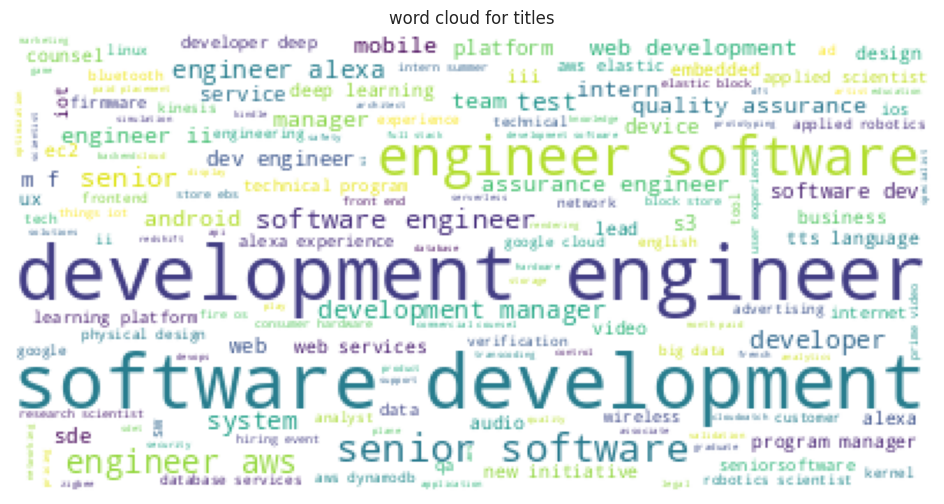

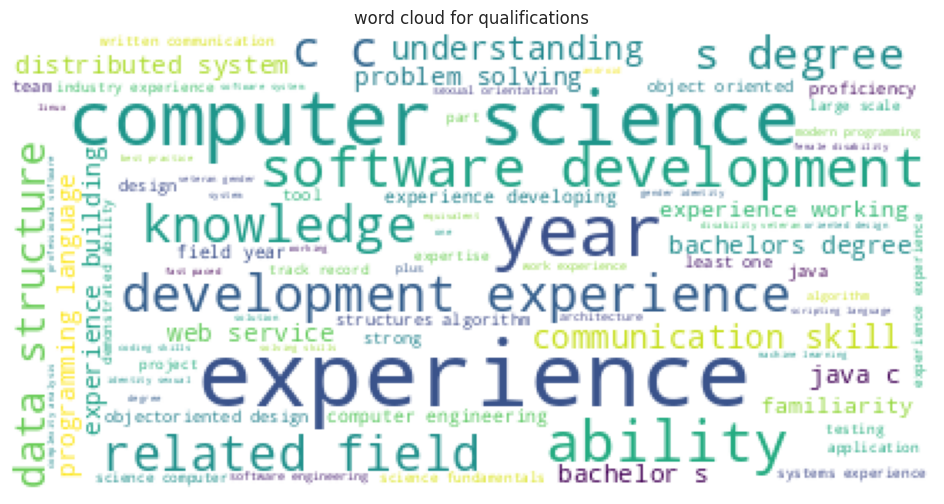

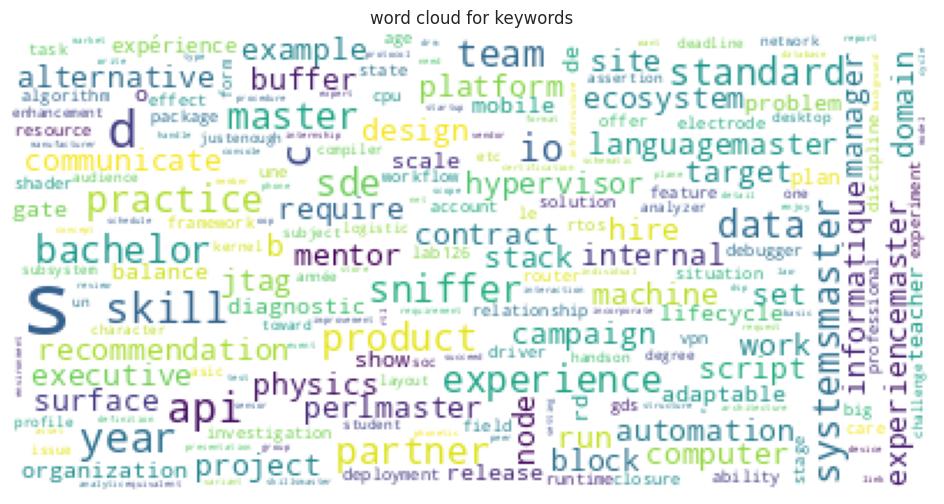


_________________________________________________________________________________________________________________________

cluster 1



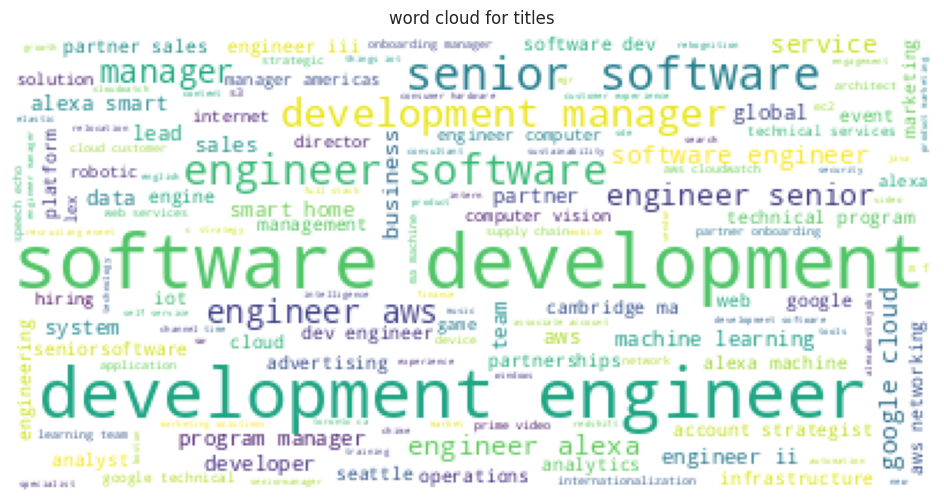

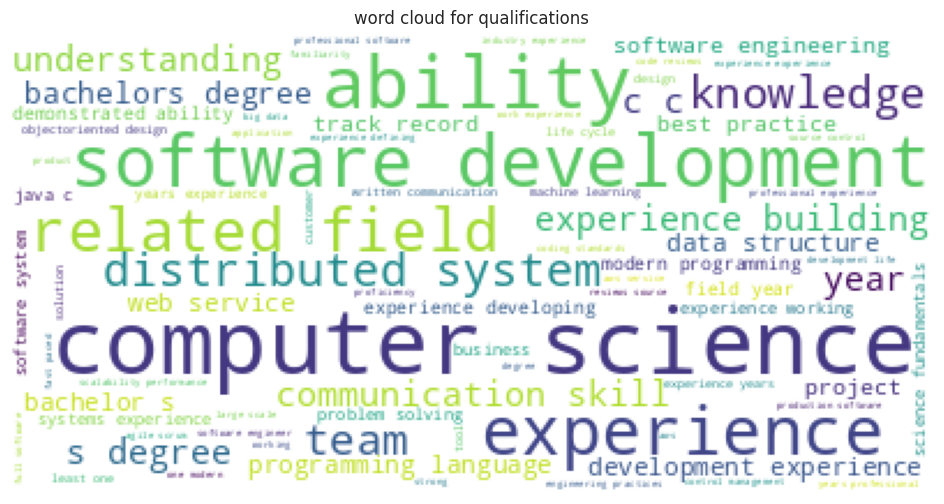

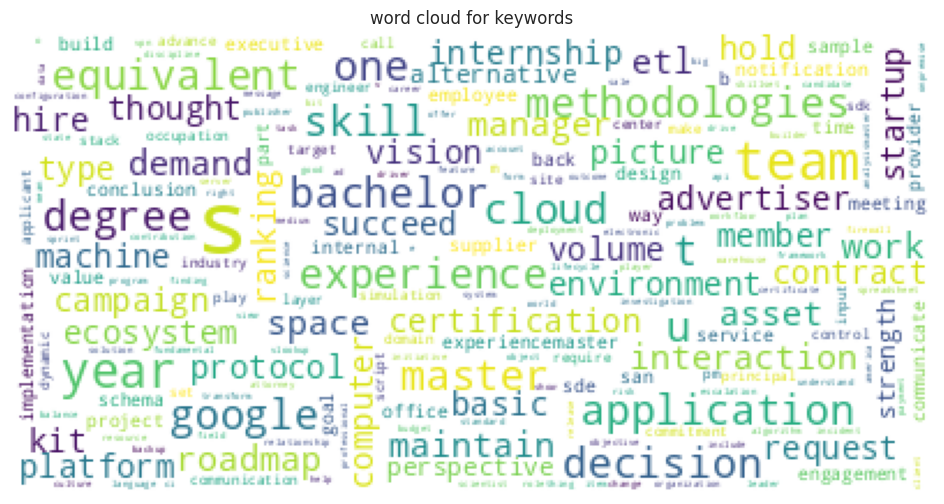


_________________________________________________________________________________________________________________________

cluster 2



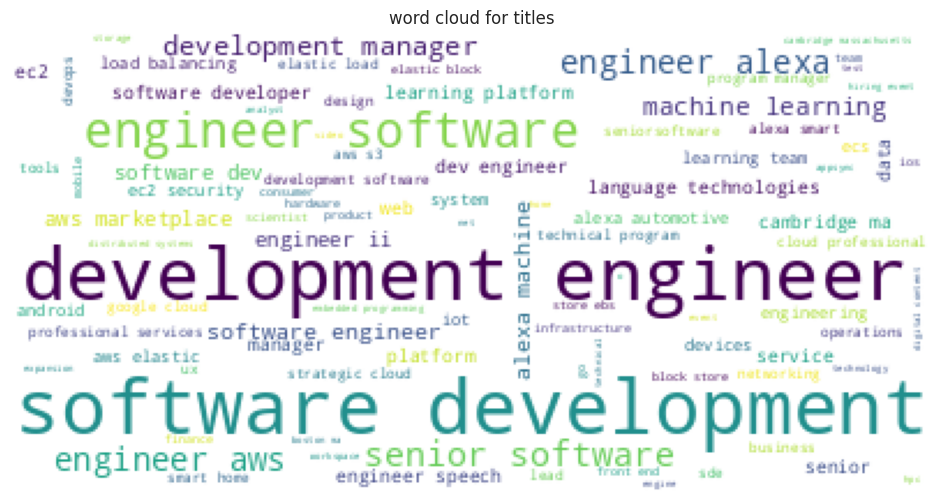

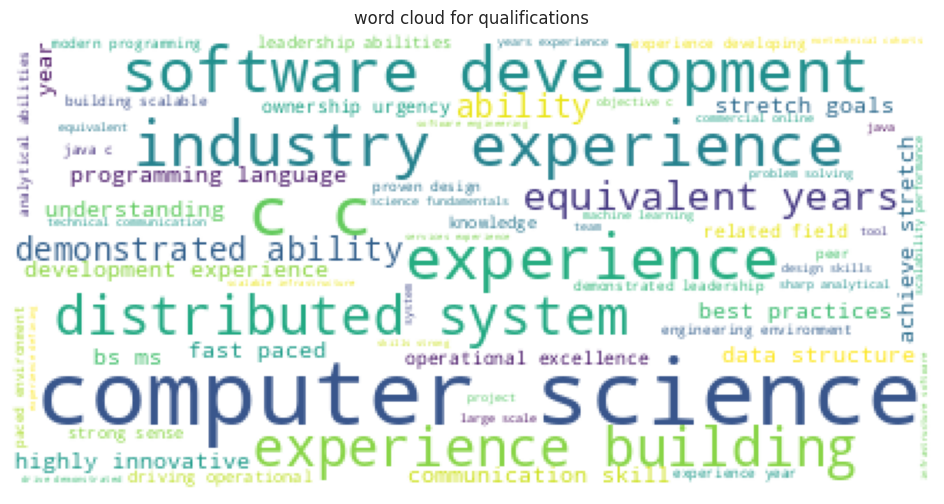

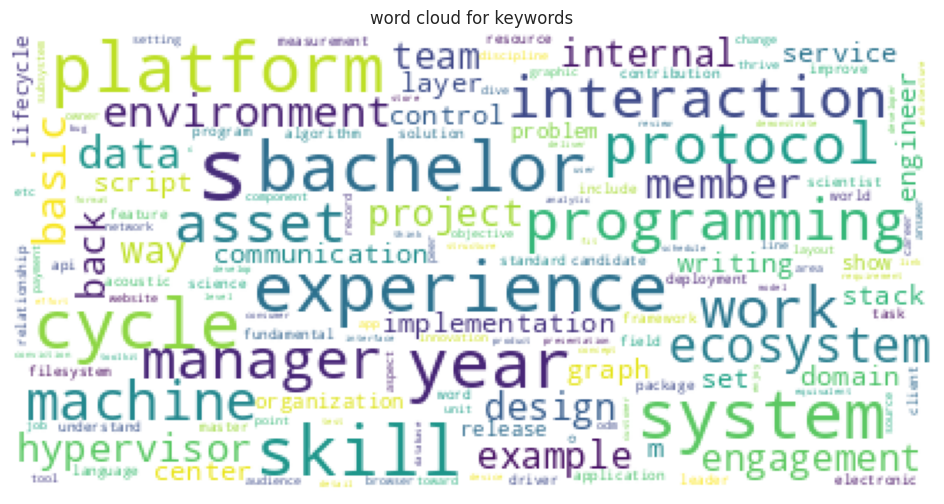


_________________________________________________________________________________________________________________________

cluster 3



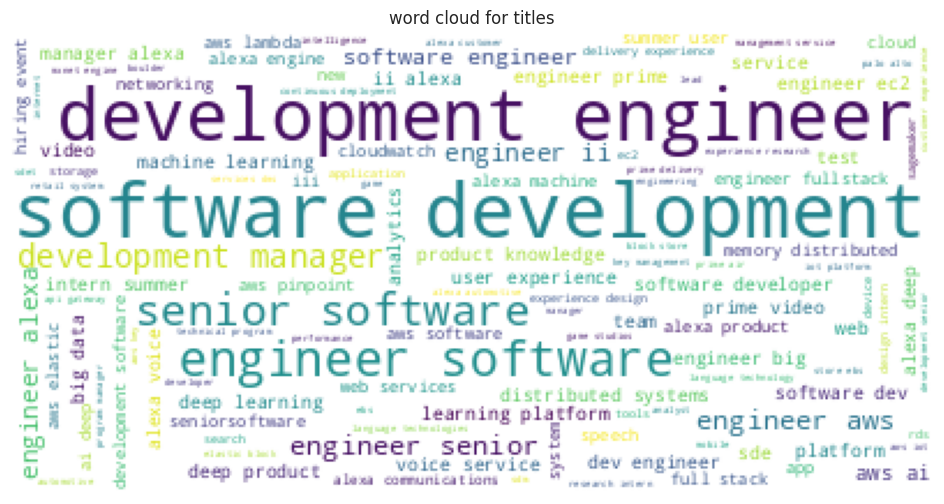

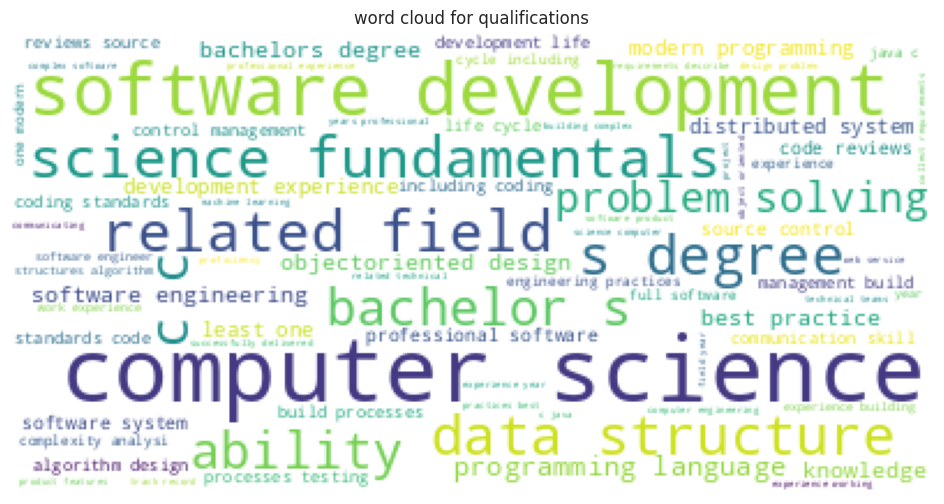

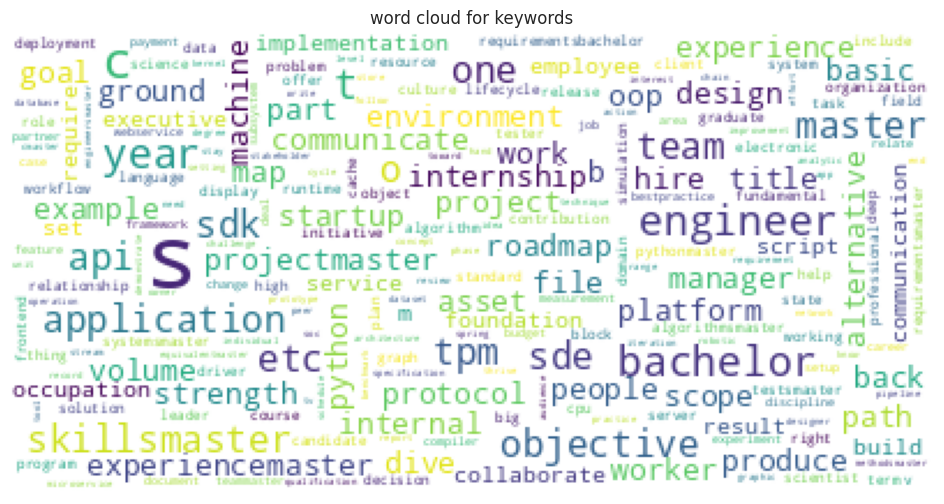


_________________________________________________________________________________________________________________________

cluster 4



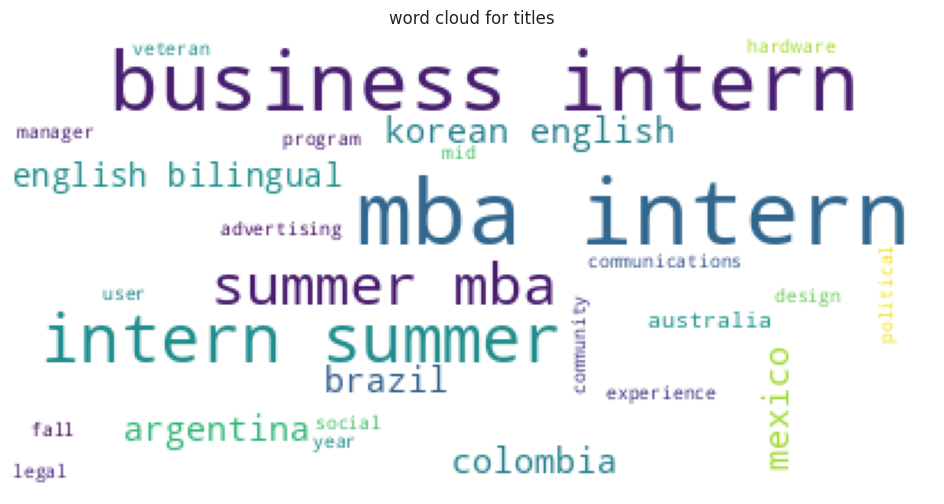

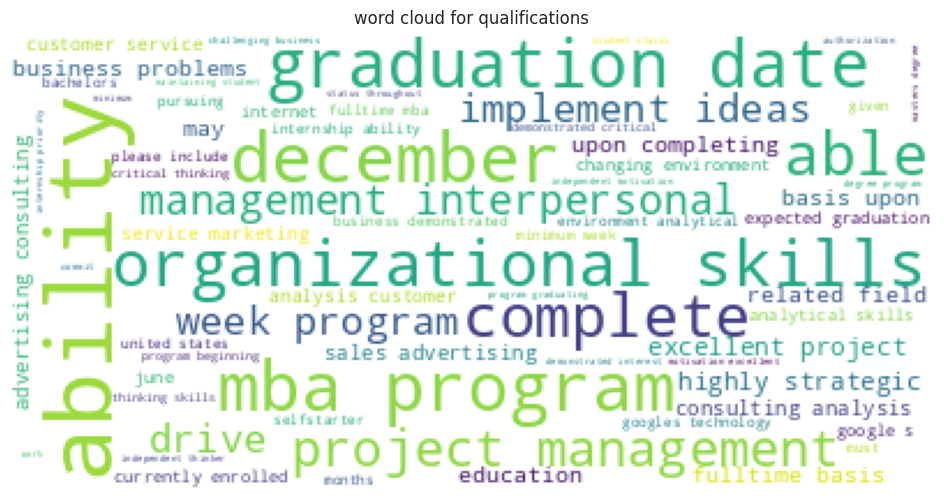

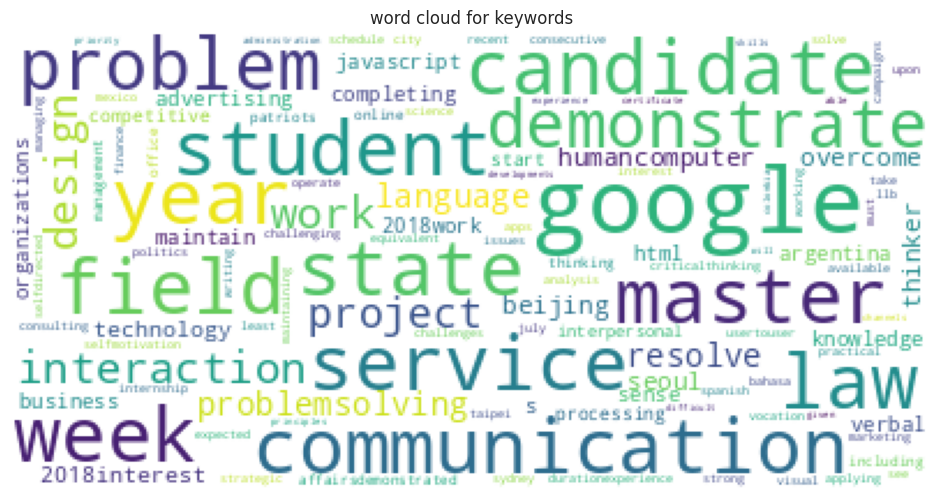


_________________________________________________________________________________________________________________________

cluster 5



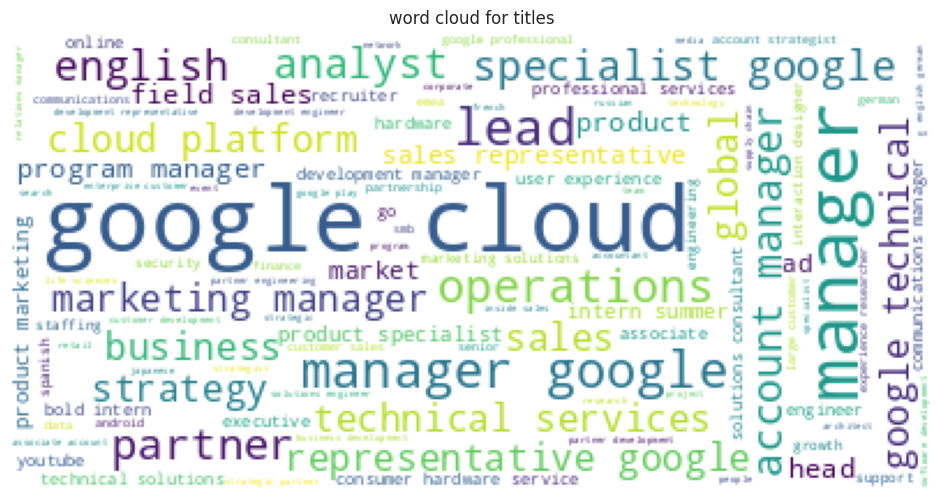

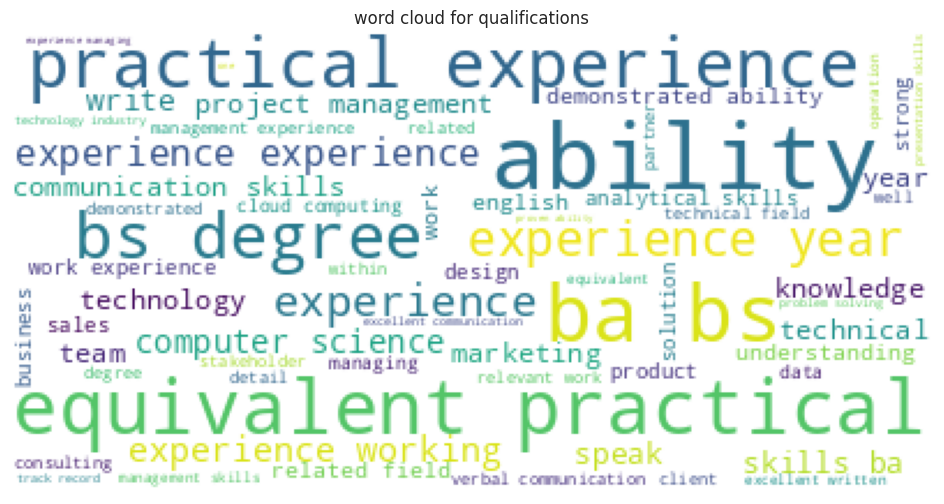

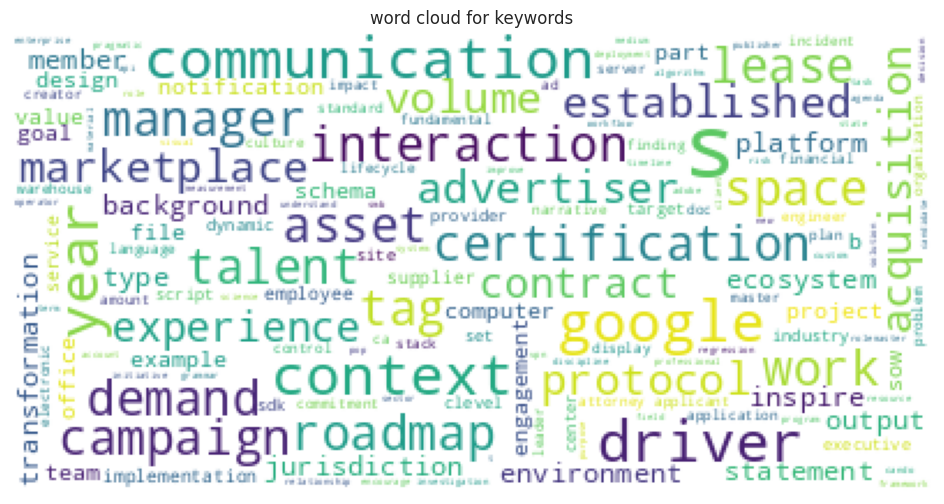


_________________________________________________________________________________________________________________________



In [25]:
num_of_clusters = len(df.label.unique())
data_dict =  {i: { 'titles' : [], 'qualifications' : [], 'keywords' : set() } for i in range(num_of_clusters) }

for ind, row in df.iterrows() : 
  data_dict[row[4]]['titles'].append(row[0])
  try : 
    data_dict[row[4]]['qualifications'].extend(row[5])
  except : 
    print(data_dict[row[4]]['qualifications'])
    print(row[5])
    break
  data_dict[row[4]]['keywords'].update(set(row[5]))

def display_wordCloud(data, feature):
  """Display word cloud
     Input : feature for which word cloud needs to be displayed and the dataframe
     Output : Displays the word cloud return None
  """
  text = ' '.join(data)
  wordcloud = WordCloud().generate(text)
  # Display the generated image: take relative word frequencies into account, lower max_font_size
  wordcloud = WordCloud(background_color="white",max_words=len(text),max_font_size=40, relative_scaling=.5).generate(text)
  plt.figure()
  plt.title('word cloud for ' + feature)
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.show()

for key, value in data_dict.items(): 

  print('cluster ' + str(key) + '\n')
  display_wordCloud(value['titles'], 'titles')
  display_wordCloud(value['qualifications'], 'qualifications')
  display_wordCloud(value['keywords'], 'keywords')
  print('\n_________________________________________________________________________________________________________________________\n')


**3.6 Remove junk words from qualifications to narrow down on skills**

After careful observation of wordclouds created above we can conclude that below are the words that can be removed to narrow down on the skills in the job description

In [26]:
job_qualification_specific_stopwords = [
    'thought', 'roadmap', 'volume', 'ecosystem', 'protocol', 'advertiser', 'maintain', 'conclusion', 'contract', 'ranking','script', 'input', 'applicant','call','implementation',
    'member', 'standard', 'part', 't', 'back', 'startup', 'internal' ,'offer', 'thing', 'e', 'block','o', 'graduation', 'date', 'fulltime', 'basis', 'education', 'jurisdiction',
    'context', 'marketplace', 'narrative', 'advertiser', 'inspire', 'talent', 'space', 'speak', 'ability', 'beijing', 'week', 'work', 'student', 
    'experience', 'practical', 'degree', 'technology', 'demonstrated', 'ability', 'english', 'understanding', 'year', 'working', 'excellent', 'related', 'field',
    'equivalent', 'google', 'developing', 'familiarity', 'least', 'one', 'building', 'knowledge', 's', 'drive', 'united states', 'may', 'june', 'upon', 'completing',
    'december', 'basis', 'pursuing', 'candidate', 'etc', 'script', 'answer', 'flow', 'career', 'peer', 'speak', 'well', 'hire', 'alternative', 'show', 'audience', 'language', 'just',
    'enough', 'manager', 'site', 'formal', 'task', 'relationship', 'domain', 'diagnostic', 'io', 'discipline', 'logistic', 'account', 'incorporate', 'teacher', 'partner', 'mentor', 'master',
    'recommendation', 'investigation', 'student', 'profile', 'plan', 'form', 'c', 'b','un', 'individual', 'closure', 'field', 'state', 'jtag', 'subject', 'brazil',
]

In [28]:
for key, value in data_dict.items():
  data_dict[key]['qualifications'] = list(filter(lambda x: x not in job_qualification_specific_stopwords, value['qualifications']))
  data_dict[key]['keywords'] = list(filter(lambda x: x not in job_qualification_specific_stopwords, value['keywords']))

cluster 0



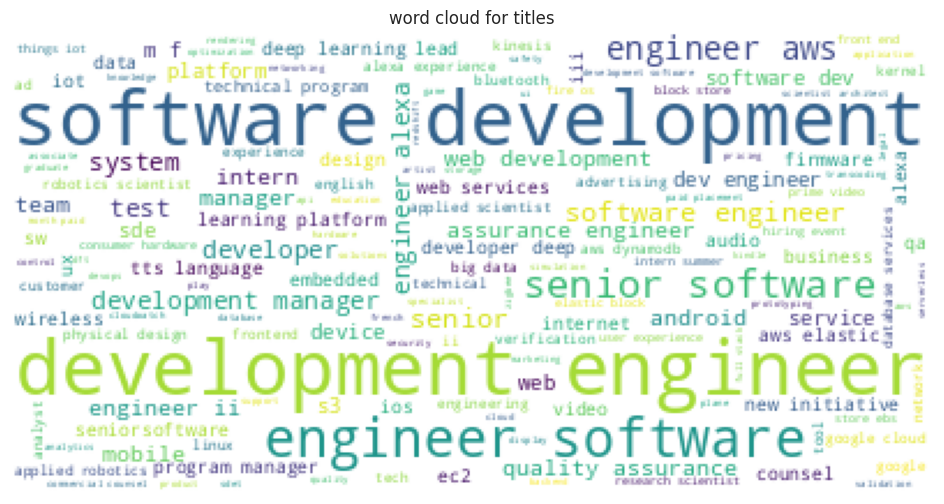

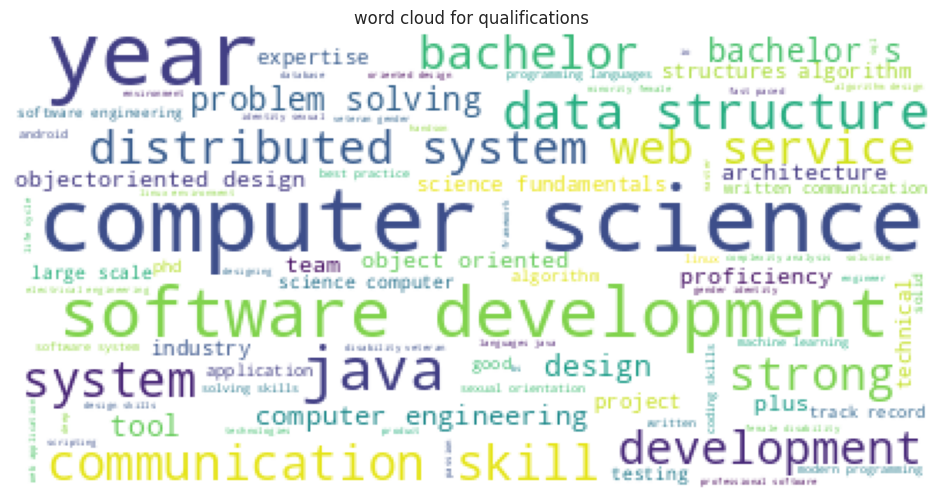

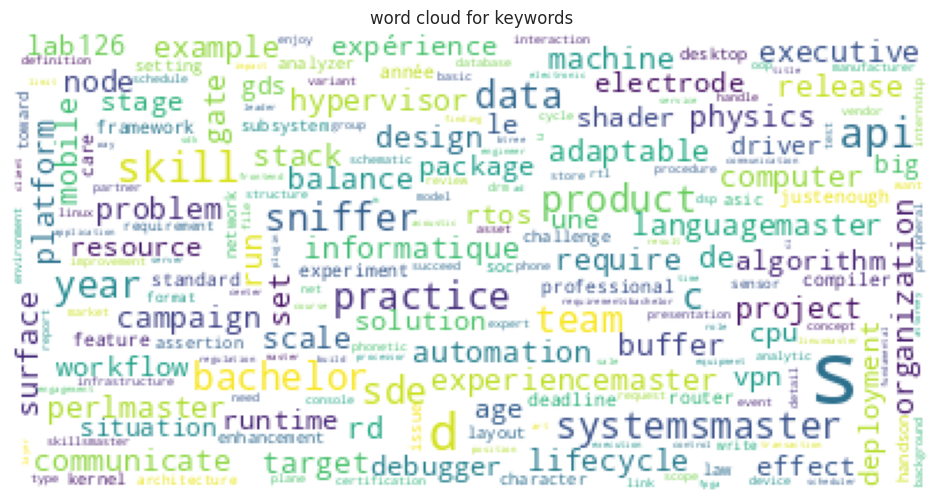


_________________________________________________________________________________________________________________________

cluster 1



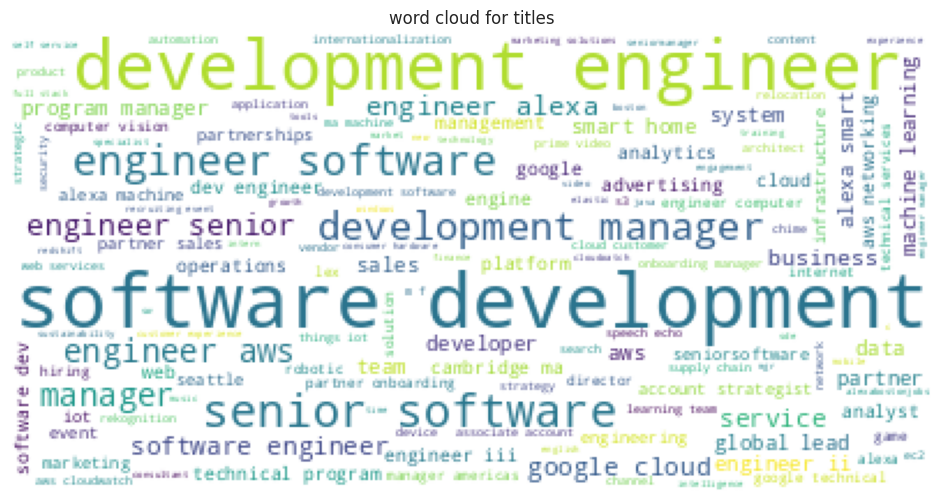

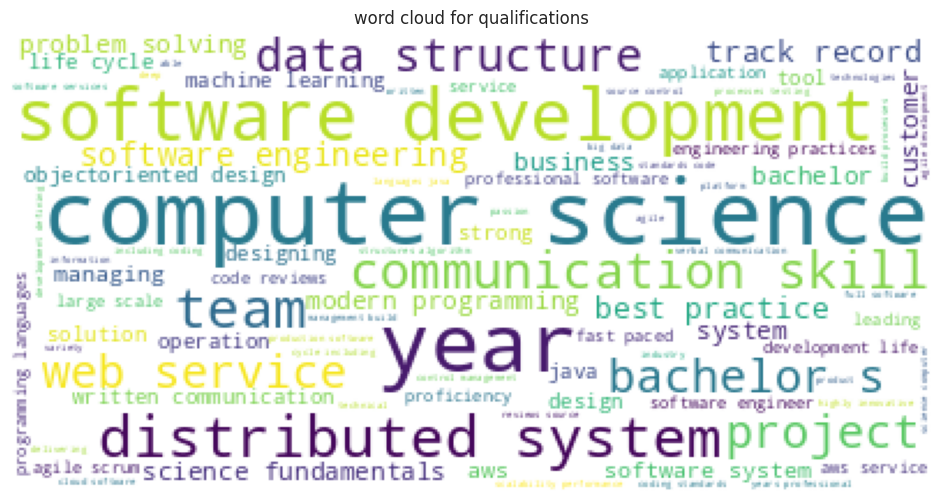

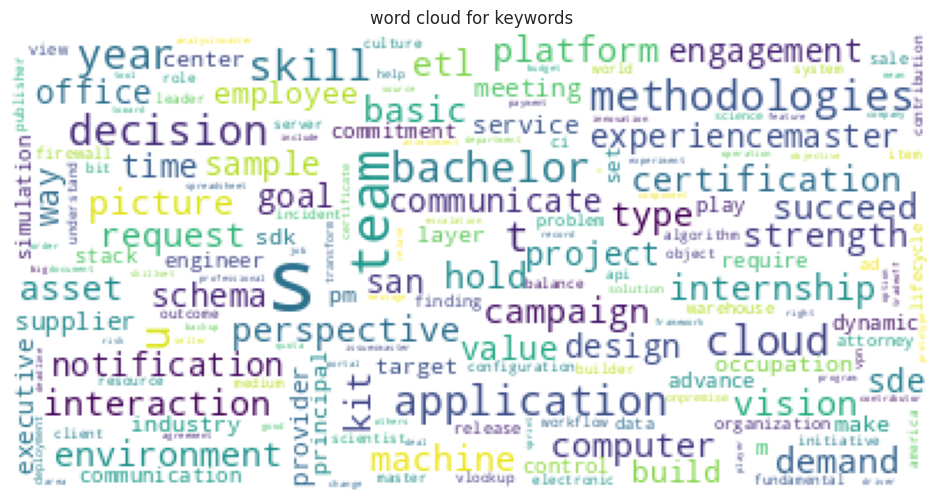


_________________________________________________________________________________________________________________________

cluster 2



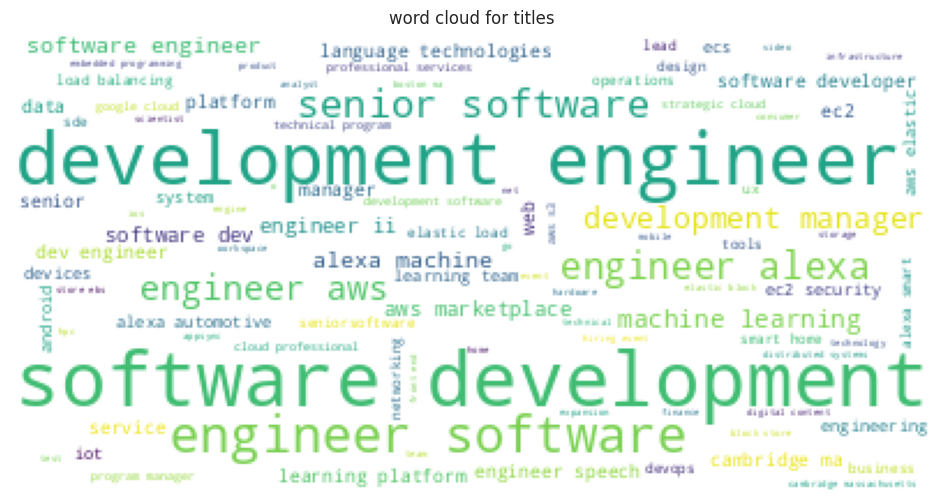

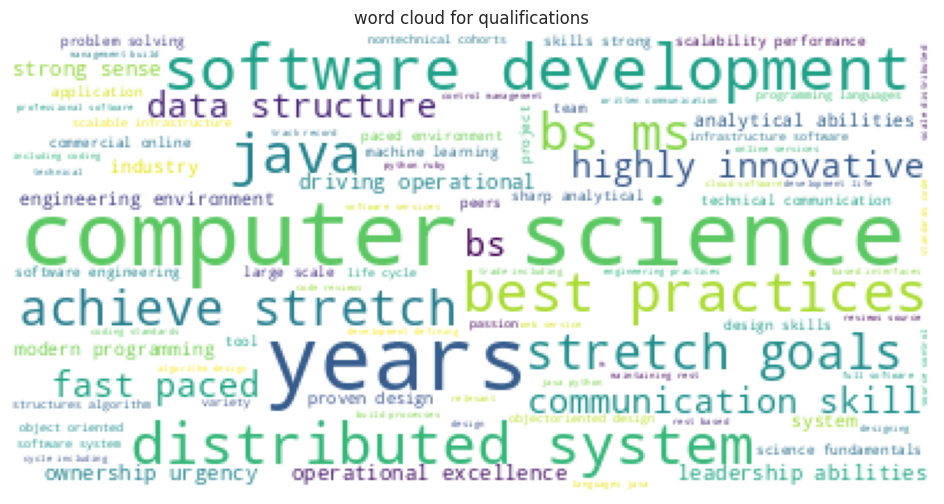

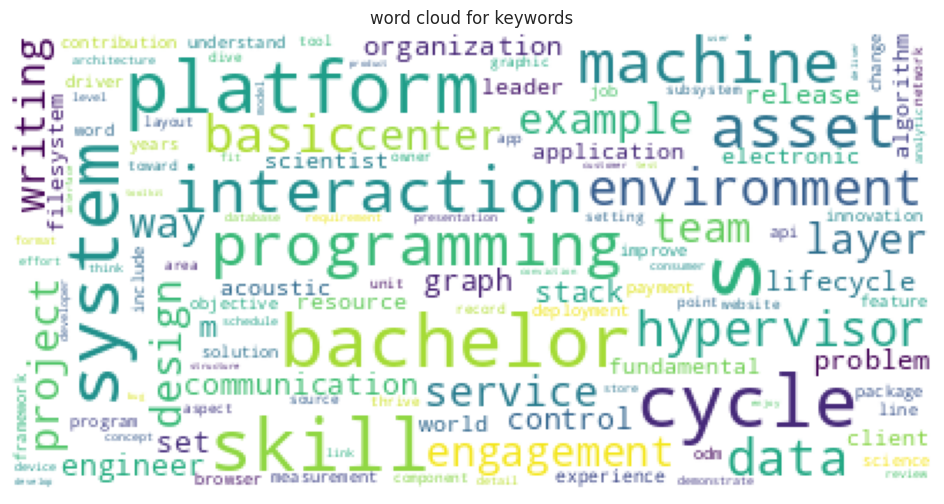


_________________________________________________________________________________________________________________________

cluster 3



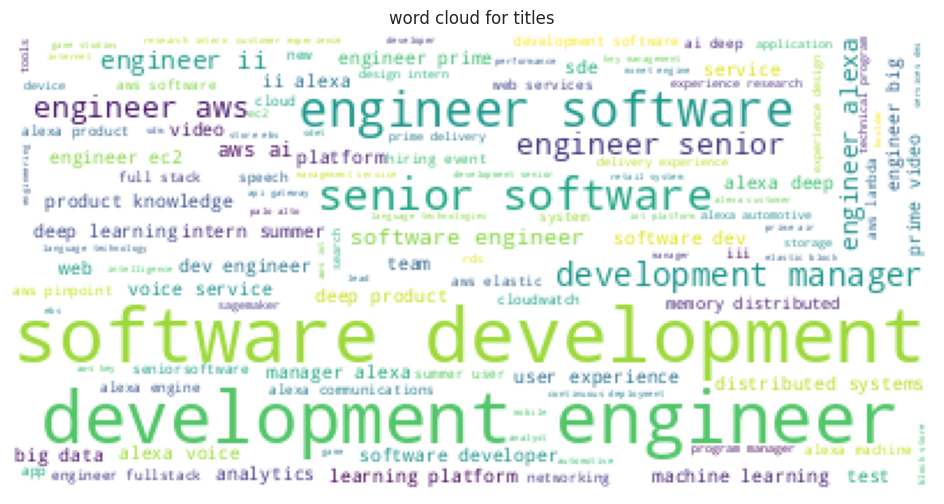

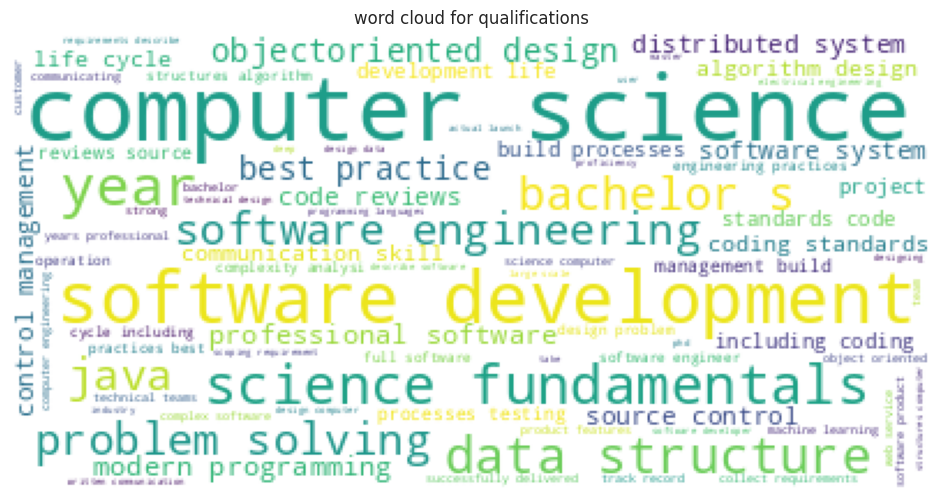

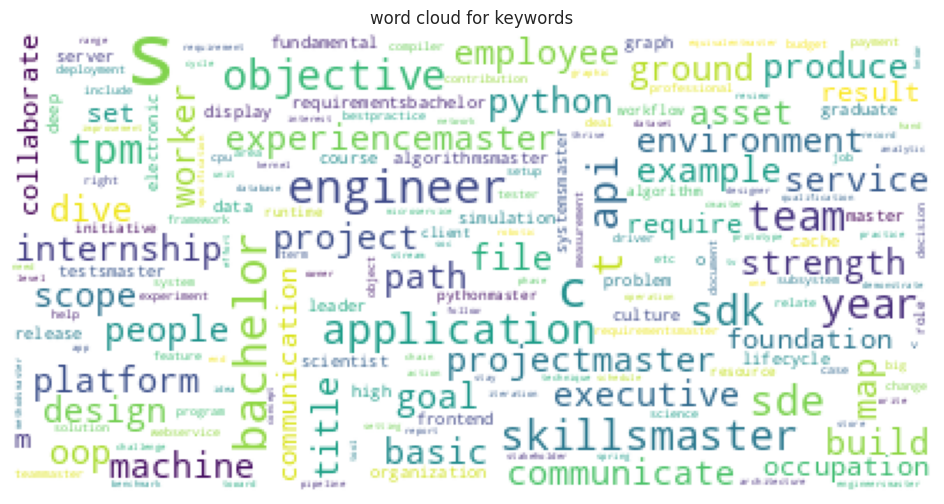


_________________________________________________________________________________________________________________________

cluster 4



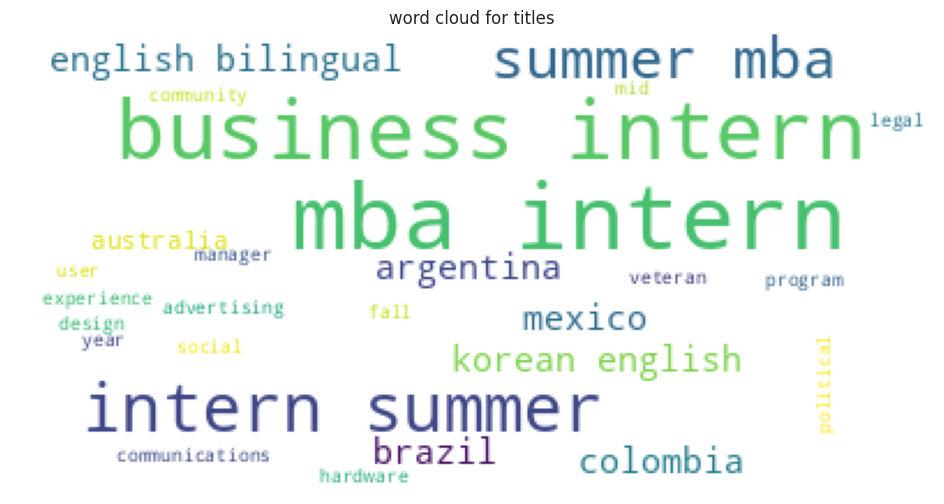

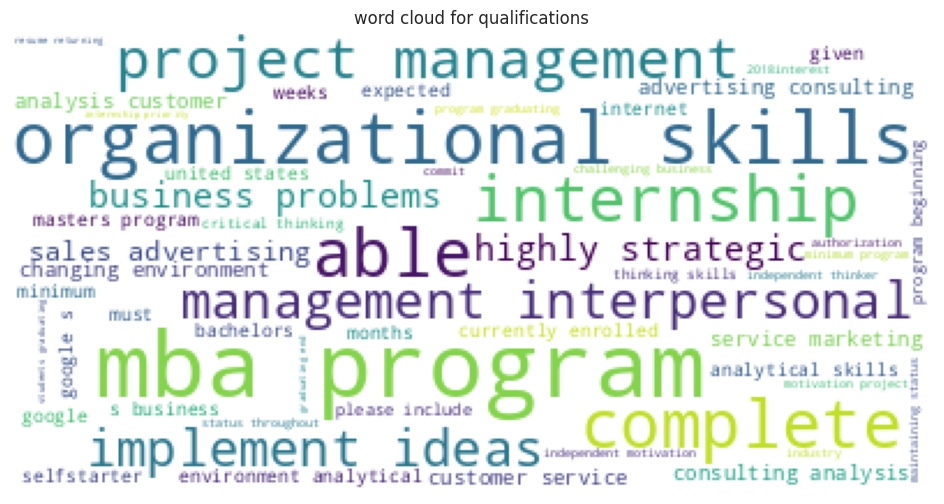

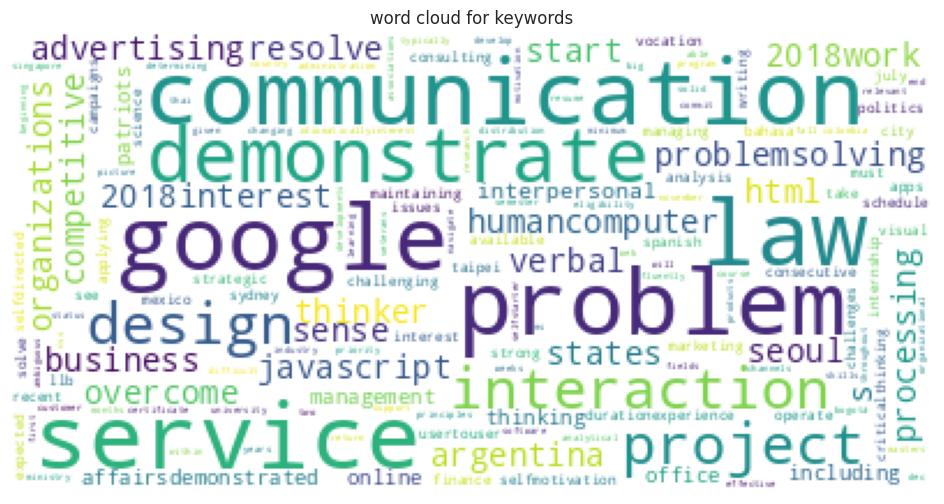


_________________________________________________________________________________________________________________________

cluster 5



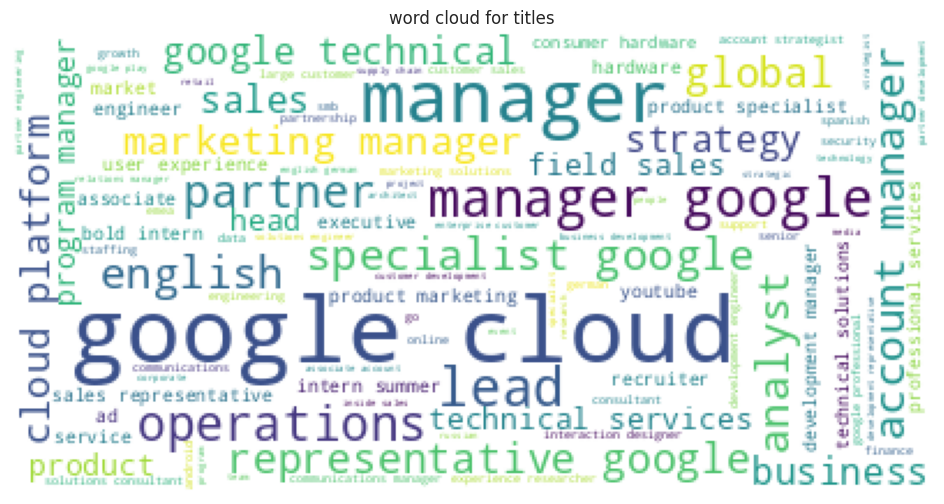

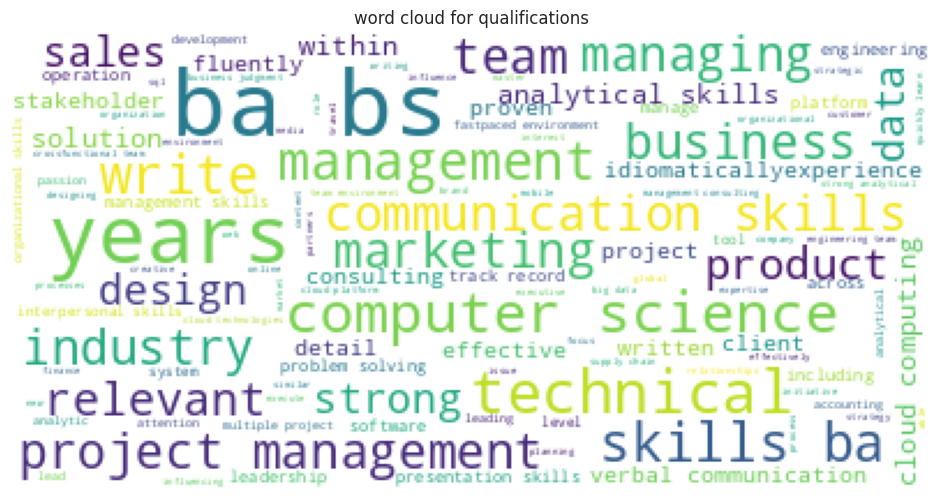

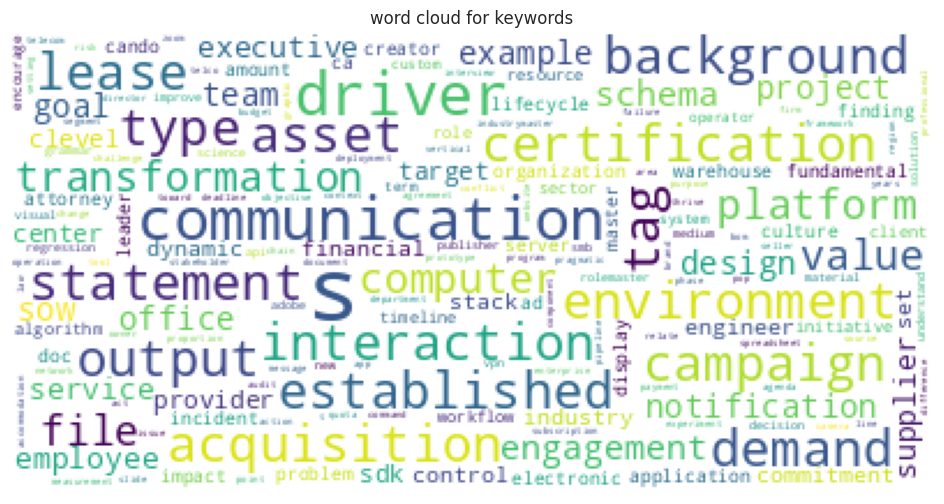


_________________________________________________________________________________________________________________________



In [29]:
for key, value in data_dict.items(): 

  print('cluster ' + str(key) + '\n')
  display_wordCloud(value['titles'], 'titles')
  display_wordCloud(value['qualifications'], 'qualifications')
  display_wordCloud(value['keywords'], 'keywords')
  print('\n_________________________________________________________________________________________________________________________\n')

**Conclusion**  

Based on the word clouds created above, we have summarized our observations and conclusion below : 


* Cluster 0 : 
* Job Titles

1. Software development engineer
2. Quality Assurance engineer

* Extracted skills : 
1. Object oriented programming/design
2. Distributed system design
3. Communication skills
4. Java
5. Data structure and algorithms
6. Problem solving

* Cluster 1 : 
* Job Titles
1. Senior Software Engineer
2. Product Development Manager

* Extracted skills : 
1. Distributed system 
2. Java, AWS, large scale managing
3. Agile
4. Scrum
5. Communication skills
6. Web services
7. Problem Solving

* Cluster 4 :
* Job Titles 
1. MBA intern
2. Business intern

* Extracted skills : 
1. Project Management
2. Organization skills
3. Interpersonal skills
4. MBA program
5. Critical thinking
6. Analytical Skills
7. Service Marketing 

Clusters 2,3 are same as cluster 1 and clusters 5 is similar to cluster 4 hence, no concrete conclusions could be derived from them and hence ommitted. 
